[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/adieulev/Certificate-DS-2024/blob/main/Labs/Lab-CP-tuto/TP_cp_classif.ipynb)

# Conformal prediction for classification purpose
Inspired by the tutorial of Angelopoulos

In [106]:
import requests

exec(requests.get("https://raw.githubusercontent.com/adieulev/Certificate-DS-2025/refs/heads/main/Labs/get-send-code.html").content)

npt_config = {
    'session_name': 'TutoCP',
    'session_owner': 'aymeric',
    'sender_name': input("Your name:"),
}
send('started', 0)

Your name:ay3


<Response [200]>

In [107]:

import os
import json
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.image import imread
!pip install -U --no-cache-dir gdown --pre

## Data preparation

### Load the data

In this cell, we prepare all necessary data for model evaluation, visualization, or analysis based on the ImageNet dataset and ResNet-152 predictions.

- Check if the ../data directory exists; if not, it downloads a .tar.gz archive using gdown, extracts it, and removes the archive.

- Ensure the human-readable ImageNet labels JSON file is present; if missing, it downloads it via wget.

- Load precomputed softmax outputs (smx) and corresponding label indices (labels) from a .npz file.

- Convert the labels to integers for further processing or evaluation.

- Read the list of example image file paths from the ../data/imagenet/examples directory.


In [3]:
# Check if the '../data' directory exists
if not os.path.exists('../data'):
    # If not, download the data archive from Google Drive using gdown
    os.system('gdown 1h7S6N_Rx7gdfO3ZunzErZy6H7620EbZK -O ../data.tar.gz')
    # Extract the contents of the tar.gz archive to the parent directory
    os.system('tar -xf ../data.tar.gz -C ../')
    # Remove the archive file after extraction
    os.system('rm ../data.tar.gz')

# Check if the human-readable ImageNet labels JSON file exists
if not os.path.exists('../data/imagenet/human_readable_labels.json'):
    # If not, download it from the specified GitHub URL using wget
    !wget -nv -O ../data/imagenet/human_readable_labels.json -L https://raw.githubusercontent.com/anishathalye/imagenet-simple-labels/master/imagenet-simple-labels.json

# Load the precomputed softmax outputs and labels from a NumPy .npz file
data = np.load('../data/imagenet/imagenet-resnet152.npz')

# Get a list of file names in the 'examples' directory
example_paths = os.listdir('../data/imagenet/examples')

# Extract the softmax predictions from the loaded data
smx = data['smx']

# Convert the loaded label data to integers
labels = data['labels'].astype(int)


In [5]:
smx.shape, labels.shape

((50000, 1000), (50000,))

### Setting parameters for conformal prediction

In [6]:
# Problem setup
n_cal = 1000    # number of calibration points
alpha = 0.1     # 1-alpha is the desired coverage

### Splitting the data

In [7]:
# Split the softmax scores into calibration and validation sets (save the shuffling)

idx = np.array([1] * n_cal + [0] * (smx.shape[0]-n_cal)) > 0
# np.random.seed(42)
np.random.shuffle(idx)

cal_smx, test_smx = smx[idx,:], smx[~idx,:]
cal_labels, test_labels = labels[idx], labels[~idx]

### Understanding what is stored in the data

The first 10 labels in the calibration set are  [ 0  0  3  4  5  6  8  8 12 13]
The minimal label is  0
The maximal label is  999


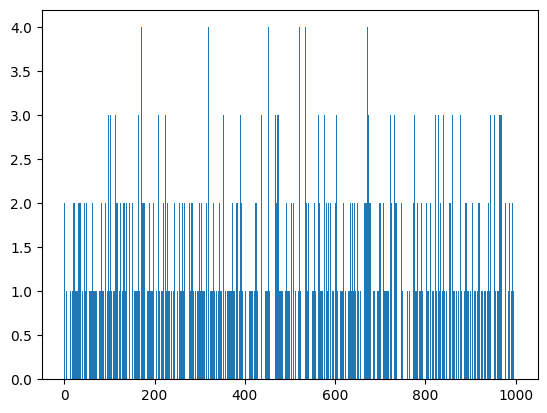

In [8]:
# Zoom on the labels in the calibration set
print("The first 10 labels in the calibration set are ", cal_labels[:10])
print("The minimal label is ", np.min(cal_labels))
print("The maximal label is ", np.max(cal_labels))
plt.hist(cal_labels, bins=1000);

The first 10 labels in the test set are  [0 0 0 0 0 0 0 0 0 0]
The minimal label is  0
The maximal label is  999


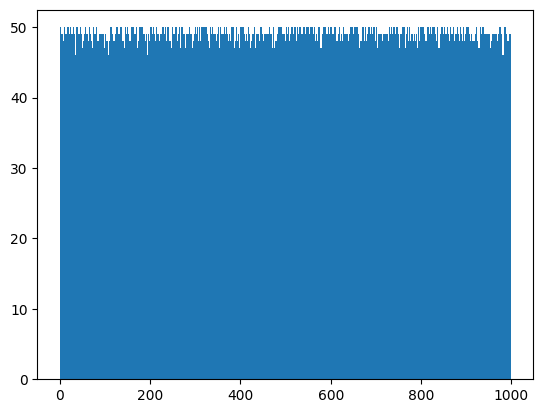

In [9]:
# Zoom on the labels in the test set
print("The first 10 labels in the test set are ", test_labels[:10])
print("The minimal label is ",np.min(test_labels))
print("The maximal label is ",np.max(test_labels))
plt.hist(test_labels,bins=1000);

In [10]:
print("The total number of different labels in the dataset:",len(np.unique(labels)))

The total number of different labels in the dataset: 1000


The sum of a row of cal_smx gives  1.0000001237999463


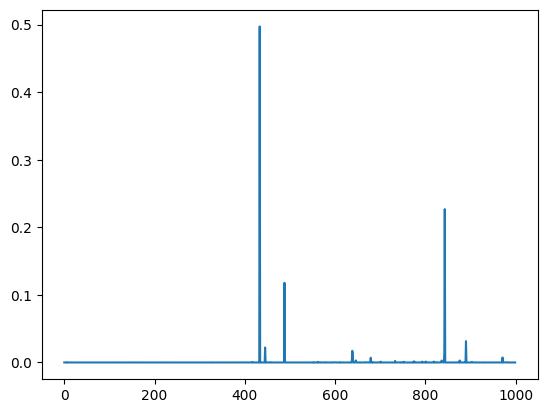

In [11]:
# Look at a row of cal_smx: this corresponds to the predicted probabilities
# (the training has been already performed)
plt.plot(cal_smx[450])
print("The sum of a row of cal_smx gives ",np.sum(cal_smx[450]))

In [12]:
# Sort cal_smx[450] in decreasing order an give top ten values
top_indices = np.argsort(cal_smx[450])[::-1][:10]        # Indices of top 10 values (sorted)
top_values = cal_smx[450][top_indices]
top_values

array([0.4972629 , 0.22693822, 0.11788769, 0.0315431 , 0.02208034,
       0.0172662 , 0.01412084, 0.01359897, 0.00736043, 0.00696003])

### A first way for conformal prediction

In this section, we implement the first strategy:

![Solution Image](https://raw.githubusercontent.com/adieulev/Certificate-DS-2025/main/Labs/Lab-CP-tuto/tutosol1.png)



To that end:

<div class="alert alert-block alert-info">
    1. For each calibration point, compute a score. <br>
    2. And then evaluate an empirical quantile of the calibration scores.  
</div>



In [13]:
# 1: get conformal scores
cal_scores = 1-cal_smx[np.arange(n_cal),cal_labels]             # TODO OPERAND



# 2: get adjusted quantile
q_level = np.ceil((n_cal+1)*(1-alpha))/n_cal                    # TODO OPERAND
qhat = np.quantile(cal_scores, q_level, interpolation='higher') # TODO OPERAND


In [14]:
cal_scores[1:10]

array([1.19209290e-07, 5.51596731e-01, 8.43852773e-01, 8.04722309e-04,
       5.38951755e-02, 6.21825457e-03, 9.99995817e-01, 2.22027302e-04,
       4.41610813e-04])

In [15]:
qhat

np.float64(0.9626938626170158)

<div class="alert alert-block alert-info">
    3. Form the prediction sets for the test set
</div>

In [16]:
# 3: form prediction sets
prediction_sets = test_smx >= (1-qhat) # 3: form prediction sets

In [17]:
prediction_sets.shape

(49000, 1000)

<div class="alert alert-block alert-info">
    4. Compute the empirical coverage
</div>

In [18]:
# Calculate empirical coverage
empirical_coverage = prediction_sets[np.arange(prediction_sets.shape[0]),test_labels].mean() #TODO OPERAND
print(f"The empirical coverage is: {empirical_coverage}")

empirical_average_set_size = prediction_sets.sum(axis=1).mean()
print(f"The empirical average set size is: {empirical_average_set_size}")

send(["The empirical coverage is:", empirical_coverage], 1)
send(["The empirical average set size is:", empirical_average_set_size], 2)

The empirical coverage is: 0.9081632653061225
The empirical average set size is: 1.9186530612244899


<Response [200]>

<div class="alert alert-block alert-info">
    5. Illustrate prediction sets for some points of the test set
</div>

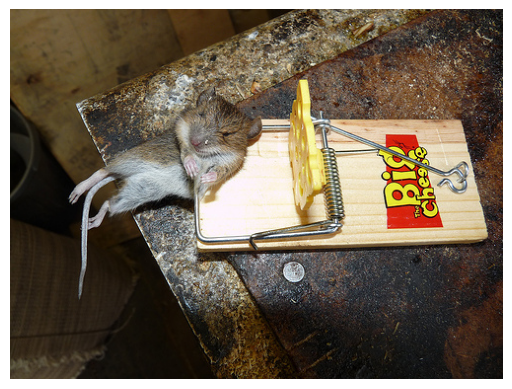

The prediction set is: [np.str_('mousetrap')]


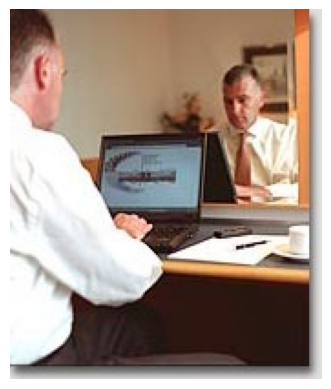

The prediction set is: [np.str_('desk'), np.str_('desktop computer'), np.str_('lab coat'), np.str_('CRT screen')]


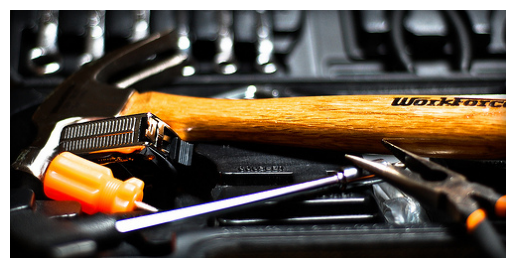

The prediction set is: [np.str_('tool kit'), np.str_('hammer'), np.str_('rifle'), np.str_('screwdriver')]


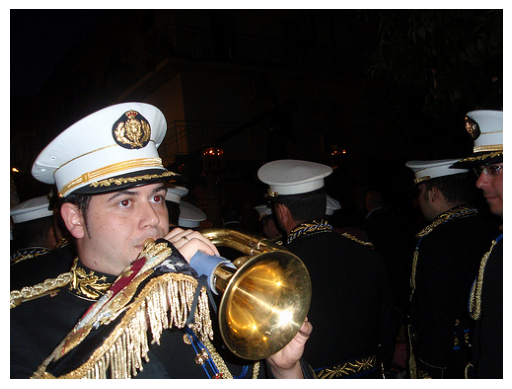

The prediction set is: [np.str_('cornet'), np.str_('saxophone'), np.str_('trombone')]


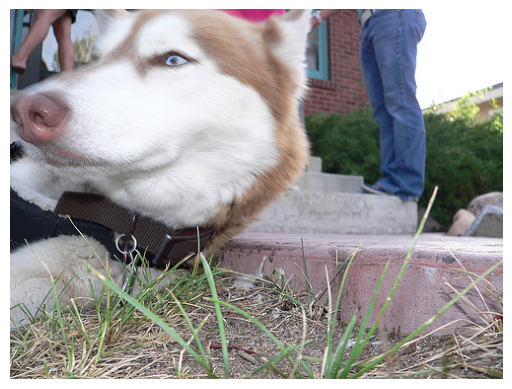

The prediction set is: [np.str_('husky'), np.str_('Siberian Husky')]


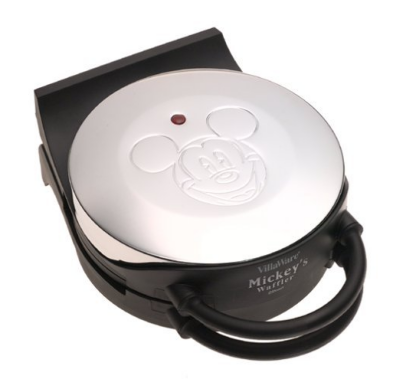

The prediction set is: [np.str_('waffle iron')]


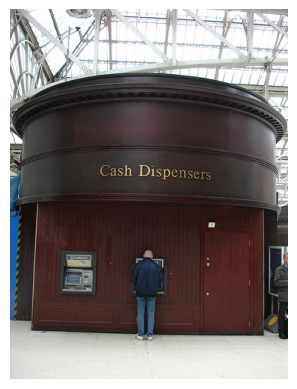

The prediction set is: [np.str_('barn'), np.str_('barrel'), np.str_('mailbox'), np.str_('front curtain'), np.str_('tobacco shop')]


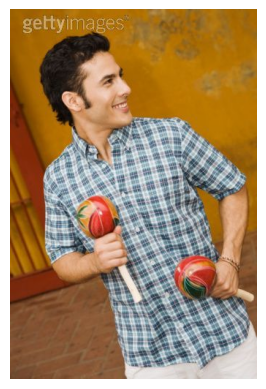

The prediction set is: [np.str_('maraca')]


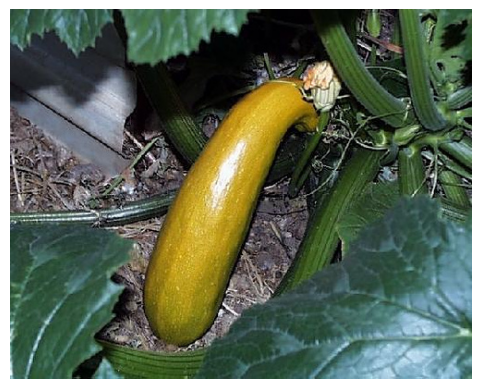

The prediction set is: [np.str_('zucchini'), np.str_('spaghetti squash')]


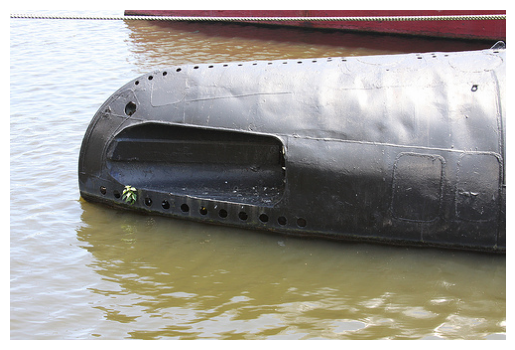

The prediction set is: [np.str_('submarine')]


In [19]:
# Making the labels human-readable
with open('../data/imagenet/human_readable_labels.json') as f:
    label_strings = np.array(json.load(f))

# Show some examples
example_paths =os.listdir('../data/imagenet/examples')
for i in range(10):
    rand_path = np.random.choice(example_paths)
    img = imread('../data/imagenet/examples/' + rand_path )
    img_index = int(rand_path.split('.')[0])
    #
    prediction_set = smx[img_index] > 1-qhat #TODO OPERAND
    #
    plt.figure()
    plt.imshow(img)
    plt.axis('off')
    send(plt, 3)
    plt.show()
    print(f"The prediction set is: {list(label_strings[prediction_set])}")

<div class="alert alert-block alert-success">This method leads to <b>small prediction sets</b>, but sacrifices <b>adaptivity</b>. </div>



## Towards more adaptive prediction sets

In this section, we are interested in the second solution:

![Solution Image](https://raw.githubusercontent.com/adieulev/Certificate-DS-2025/main/Labs/Lab-CP-tuto/tutosol2.png)


<div class="alert alert-block alert-info">
    <ol>
<li>Sort in decreasing order $\hat{p}_{\sigma_i(1)}(X_i) \geq ... \geq  \hat{p}_{\sigma_i(C)}(X_i)$</li>
   

To that end:

<li> Compute the calibration scores $S_i = \sum_{k=1}^{\sigma_i^{-1}(Y_i)} \hat{p}_{\sigma_i(k)}(X_i)$ (sum of the estimated probabilities associated to classes at least as large as that of the true class $Y_i$)} </li>
    <li> Get the quantile $q_{1-\alpha}(\mathcal{S})$ </li>
<li> Return the classes $\sigma_{\text{new}}(1),... ,\sigma_{\text{new}}(r^\star)$ where $r^{\star} = \text{argmax}_{1 \leq r \leq C}\left\{ \sum_{k=1}^{r} \hat{p}_{\sigma_{\text{new}}(k)}(X_{\text{new}}) < q_{1-\alpha}(\mathcal{S}) \right\} + 1$</li>
         </ol>

NB : to avoid the +1, you can use the corrected quantile ;)

In [20]:
# true_probs = cal_smx[np.arange(n_cal), cal_labels]
# print("True probs 90% quantile:", np.quantile(true_probs, 0.1))  # Should be > 0.07
# print("True probs 50% quantile:", np.quantile(true_probs, 0.5))  # Median

In [21]:
# true_ranks = (cal_pi == cal_labels[:, None]).argmax(axis=1)
# print("True rank 90% quantile:", np.quantile(true_ranks, 0.9))
# print("True rank max:", true_ranks.max())


In [91]:
# 1. Get for each row the indices that would sort the probabilities in descending order
cal_pi = cal_smx.argsort(1)[:, ::-1]  #TODO OPERAND # shape: (n_cal, n_classes)

#argsort in increasing order, so order reverting by [:,::-1]


# 2. Use the sorted indices to get the sorted probabilities in descending order
cal_srt = np.take_along_axis(cal_smx, cal_pi, axis=1) #TODO OPERAND  # shape: (n_cal, n_classes)

# 3. Get the rank (position) of the true label in the sorted index array
# cal_L = np.where(cal_pi == cal_labels[:, None])[1]  #TODO OPERAND # shape: (n_cal,)
# For each row, find at which index the true label appears in the sorted predictions
cal_L = (cal_pi == cal_labels[:, None]).argmax(axis=1)  # row-wise rank of the true label


# Or with modif
zeros_col = np.zeros((cal_srt.shape[0], 1))
cal_srt_modified = np.hstack((zeros_col, cal_srt))

# 4. Compute the cumulative probability up to the true label — the conformal score
cal_scores = cal_srt.cumsum(axis=1)[np.arange(n_cal), cal_L] #TODO OPERAND
cal_scores_modified = cal_srt_modified.cumsum(axis=1)[np.arange(n_cal), cal_L] #TODO OPERAND
# This is the sum of predicted probabilities (in descending order) up to and including the true label

# 5. Compute the quantile threshold for calibration
qhat = np.quantile(
    cal_scores,
    np.ceil((n_cal + 1) * (1 - alpha)) / n_cal,
    method='higher'  # use 'interpolation' only for old NumPy; 'method' is preferred in newer versions
)

qhat_modified = np.quantile(
    cal_scores_modified,
    np.ceil((n_cal + 1) * (1 - alpha)) / n_cal,
    method='higher'  # use 'interpolation' only for old NumPy; 'method' is preferred in newer versions
)


In [92]:
qhat, qhat_modified

(np.float64(0.9999195337295532), np.float64(0.8183185756206512))

In [100]:
# Deploy on the test set
n_test = test_smx.shape[0]

# sorting the predicted probabilities (softmax outputs) on the test set
test_pi = test_smx.argsort(1)[:,::-1] #TODO OPERAND

# reordering
test_srt = np.take_along_axis(test_smx,test_pi,axis=1) #TODO OPERAND

#test_srt_cumsum = test_srt.cumsum(axis=1)
# cumulative softmax outputs
indicators = test_srt.cumsum(axis=1) <= qhat #TODO OPERAND
prediction_sets = np.take_along_axis(indicators,test_pi.argsort(axis=1),axis=1) #TODO OPERAND

# With modified
# Step 1: Remove the last column + Create a column of True values and stack
indicators_modified = test_srt.cumsum(axis=1) <= qhat_modified #TODO OPERAND
indicators_trimmed = indicators_modified[:, :-1]
true_col = np.ones((indicators.shape[0], 1), dtype=bool)
indicators_modified = np.hstack((true_col, indicators_trimmed))
prediction_sets_modified = np.take_along_axis(indicators_modified,test_pi.argsort(axis=1),axis=1) #TODO OPERAND


In [94]:
test_srt[0,:10]

array([0.55534738, 0.21311259, 0.10651033, 0.051203  , 0.04443701,
       0.00575172, 0.00574396, 0.00183223, 0.00163802, 0.00155338])

In [95]:
test_srt.cumsum(axis=1) <= qhat

array([[ True,  True,  True, ..., False, False, False],
       [ True,  True,  True, ..., False, False, False],
       [ True,  True,  True, ..., False, False, False],
       ...,
       [ True,  True,  True, ..., False, False, False],
       [ True,  True,  True, ..., False, False, False],
       [ True,  True,  True, ..., False, False, False]])

In [96]:
indicators_modified

array([[ True,  True,  True, ..., False, False, False],
       [ True, False, False, ..., False, False, False],
       [ True,  True, False, ..., False, False, False],
       ...,
       [ True,  True,  True, ..., False, False, False],
       [ True, False, False, ..., False, False, False],
       [ True, False, False, ..., False, False, False]])

In [97]:
prediction_sets = np.take_along_axis(indicators,test_pi.argsort(axis=1),axis=1) #TODO OPERAND
prediction_sets

array([[ True, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       ...,
       [False, False, False, ..., False, False,  True],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False]])

In [101]:
# Calculate empirical coverage

empirical_coverage = prediction_sets[np.arange(n_test),test_labels].mean() #TODO OPERAND
print(f"The empirical coverage is: {empirical_coverage}")

empirical_average_set_size = prediction_sets.sum(axis=1).mean()
print(f"The empirical average set size is: {empirical_average_set_size}")

print(f"The quantile is: {qhat}")
send(["The empirical coverage is:", empirical_coverage], 4)
send(["The empirical average set size is:", empirical_average_set_size], 5)

The empirical coverage is: 0.9063877551020408
The empirical average set size is: 225.76469387755103
The quantile is: 0.9999195337295532


<Response [200]>

In [102]:
# Calculate empirical coverage
empirical_coverage_modified = prediction_sets_modified[np.arange(n_test), test_labels].mean() #TODO OPERAND
print(f"The modified  empirical coverage is: {empirical_coverage}")

empirical_average_set_size_modified = prediction_sets_modified.sum(axis=1).mean()
print(f"The modified  empirical average set size is: {empirical_average_set_size_modified}")

print(f"The quantile is: {qhat_modified}")
send(["The modified empirical coverage is:", empirical_coverage_modified], 4)
send(["The modified  empirical average set size is:", empirical_average_set_size_modified], 5)

The modified  empirical coverage is: 0.9063877551020408
The modified  empirical average set size is: 2.586061224489796
The quantile is: 0.8183185756206512


<Response [200]>

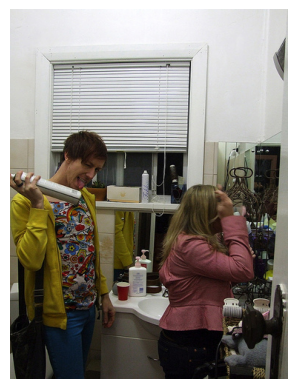

The prediction set is: [np.str_('apron'), np.str_('barber chair'), np.str_('barbershop'), np.str_('can opener'), np.str_('Crock Pot'), np.str_('hair spray'), np.str_('hair dryer'), np.str_('lab coat'), np.str_('ladle'), np.str_('mixing bowl'), np.str_('paintbrush'), np.str_('paper towel'), np.str_('plunger'), np.str_('spatula'), np.str_('strainer'), np.str_('waffle iron'), np.str_('crossword'), np.str_('toilet paper')]


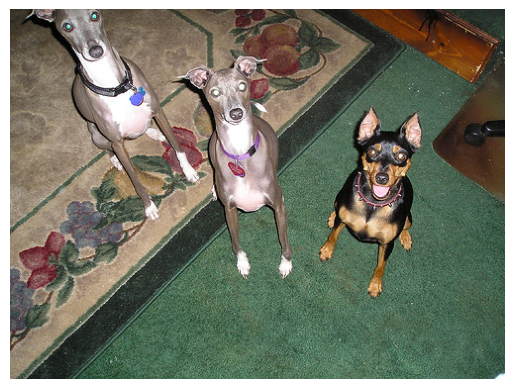

The prediction set is: []


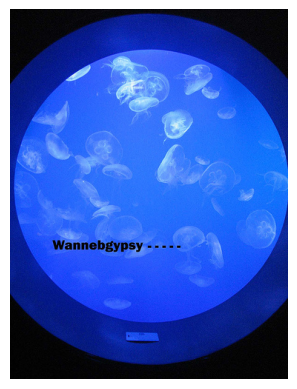

The prediction set is: []


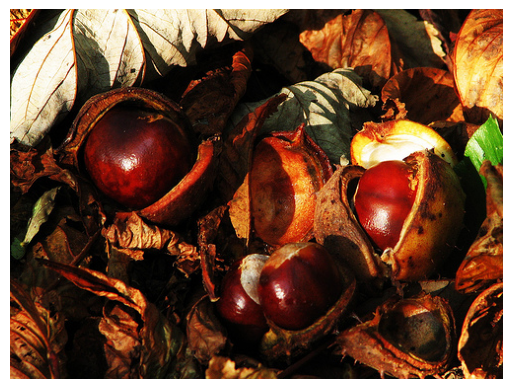

The prediction set is: []


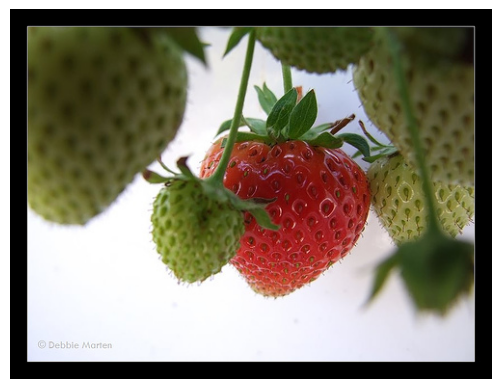

The prediction set is: []


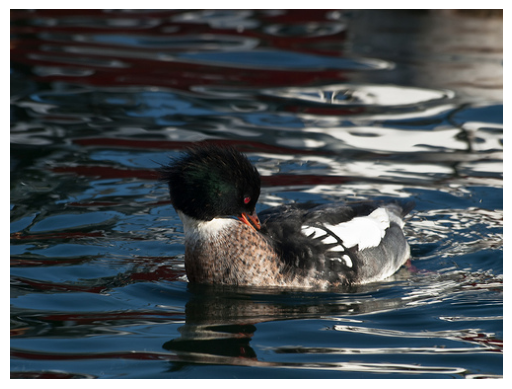

The prediction set is: []


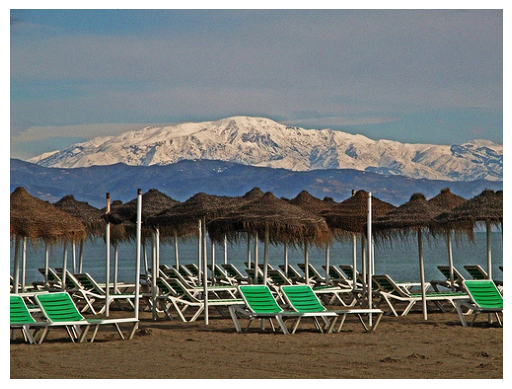

The prediction set is: [np.str_('barn'), np.str_('wheelbarrow'), np.str_('boathouse'), np.str_('dock'), np.str_('folding chair'), np.str_('picket fence'), np.str_('plow'), np.str_('rocking chair'), np.str_('shovel'), np.str_('thatched roof'), np.str_('split-rail fence'), np.str_('yurt'), np.str_('lakeshore'), np.str_('shoal'), np.str_('seashore')]


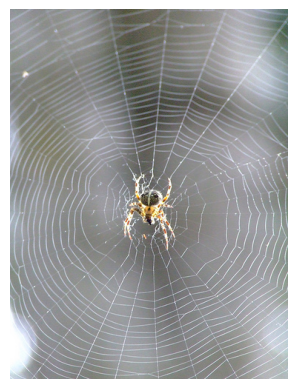

The prediction set is: []


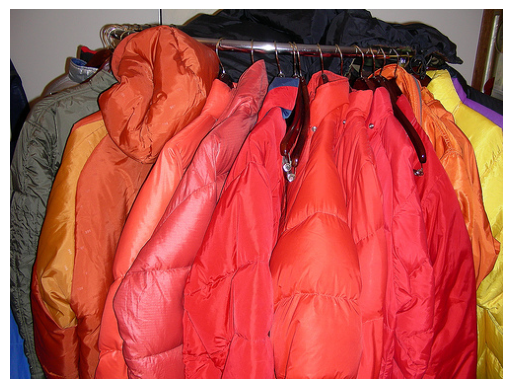

The prediction set is: []


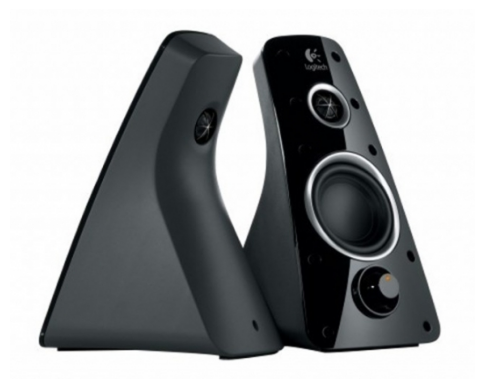

The prediction set is: []


In [105]:
# TODO CELL TO ADAPT TO MODIFIED CASE

# Show some examples
with open('../data/imagenet/human_readable_labels.json') as f:
    label_strings = np.array(json.load(f))

example_paths =os.listdir('../data/imagenet/examples')
for i in range(10):
    rand_path = np.random.choice(example_paths)
    img = imread('../data/imagenet/examples/' + rand_path )
    img_index = int(rand_path.split('.')[0])
    # Form the prediction set


    _smx = smx[img_index]         #TODO OPERAND
    _pi = np.argsort(_smx)[::-1]  #TODO OPERAND
    _srt = np.take_along_axis(_smx,_pi,axis=0) #TODO OPERAND
    _srt_cumsum = _srt.cumsum()        #TODO OPERAND
    _ind = _srt_cumsum <= qhat  #TODO OPERAND

#     _smx = smx[img_index]         #TODO OPERAND
#     _pi = np.argsort(_smx)[::-1]  #TODO OPERAND
#     _srt = np.take_along_axis(_smx,_pi,axis=0) #TODO OPERAND
#     _srt_reg_cumsum = _srt_reg.cumsum()        #TODO OPERAND
#     _ind = (_srt_reg_cumsum - np.random.rand()*_srt_reg) <= qhat if rand else _srt_reg_cumsum - _srt_reg <= qhat #TODO OPERAND

    # if disallow_zero_sets: _ind[0] = True
    prediction_set = np.take_along_axis(_ind,_pi.argsort(),axis=0)
    plt.figure()
    plt.imshow(img)
    plt.axis('off')
    send(plt, 6)
    plt.show()
    print(f"The prediction set is: {list(label_strings[prediction_set])}")

In [ ]:
cal_pi = cal_smx.argsort(1)[:, ::-1]  # Indices that sort each row descending
cal_srt = np.take_along_axis(cal_smx, cal_pi, axis=1)  # Sorted softmax values
# Check if each row is sorted
assert np.all(np.diff(cal_srt, axis=1) <= 1e-6)

cal_L = (cal_pi == cal_labels[:, None]).argmax(axis=1)


# Check that it matches softmax
true_probs_from_srt = cal_srt[np.arange(n_cal), cal_L]
true_probs_direct = cal_smx[np.arange(n_cal), cal_labels]
np.testing.assert_allclose(true_probs_from_srt, true_probs_direct, rtol=1e-5)

cal_scores = cal_srt.cumsum(axis=1)[np.arange(n_cal), cal_L]
for i in range(5):
    print("True label prob:", cal_smx[i, cal_labels[i]])
    print("Sorted probs:", cal_srt[i, :10])
    print("Cumulative sum up to true label:", cal_scores[i])
    print("True label rank:", cal_L[i])
    print("-" * 40)

True label prob: 0.3583102226257324
Sorted probs: [5.55152833e-01 3.58310223e-01 5.16091958e-02 2.48174947e-02
 4.81388625e-03 1.88522926e-03 8.68003524e-04 6.26838824e-04
 2.88783602e-04 1.93785847e-04]
Cumulative sum up to true label: 0.9134630560874939
True label rank: 1
----------------------------------------
True label prob: 0.9996594190597534
Sorted probs: [9.99659419e-01 2.42349488e-04 5.83350848e-05 2.44883140e-05
 2.97633619e-06 2.35061907e-06 2.32129128e-06 2.17744878e-06
 1.20170137e-06 5.77802950e-07]
Cumulative sum up to true label: 0.9996594190597534
True label rank: 0
----------------------------------------
True label prob: 0.9358944296836853
Sorted probs: [9.35894430e-01 3.76125202e-02 1.06332265e-02 8.67363811e-03
 3.59028671e-03 5.21087262e-04 3.58189223e-04 2.87667150e-04
 2.28814315e-04 2.15475564e-04]
Cumulative sum up to true label: 0.9358944296836853
True label rank: 0
----------------------------------------
True label prob: 0.00013419752940535545
Sorted probs

What happens here ?
- many ponts are very well predicted !
- those lead to high scores, because the cumulatove probability to include the point is close to 1.


## Another way for adaptive predictive sets in classification


[Sadinle, Lei, Wasserman] https://arxiv.org/abs/1609.00451


[Notebook source](https://github.com/aangelopoulos/conformal-prediction/blob/main/notebooks/imagenet-raps.ipynb)

In [ ]:
# Set RAPS regularization parameters (larger lam_reg and smaller k_reg leads to smaller sets)
lam_reg = 0.01
k_reg = 5
disallow_zero_sets = False # Set this to False in order to see the coverage upper bound hold
rand = True # Set this to True in order to see the coverage upper bound hold
reg_vec = np.array(k_reg*[0,] + (smx.shape[1]-k_reg)*[lam_reg,])[None,:] # create a row with 5 zeroes and the rest at 0.01

In [ ]:
# Get scores

# get for each row the position of the predicted probabilities in decreasing order
cal_pi = cal_smx.argsort(1)[:,::-1] #argsort in increasing order, so order reverting by [:,::-1]

# form for each row the predicted probabilities in decreasing order
cal_srt = np.take_along_axis(cal_smx,cal_pi,axis=1)

cal_srt_reg = cal_srt + reg_vec # addition row by row of 0 0 0 0 0 0.1 0.1 ....

# get the rank of the true label in the sorted predicted probabilities
cal_L = np.where(cal_pi == cal_labels[:,None])[1]

# compute the calibration scores (why minus something????)
cal_scores = cal_srt_reg.cumsum(axis=1)[np.arange(n_cal),cal_L] - np.random.rand(n_cal)*cal_srt_reg[np.arange(n_cal),cal_L]

# Get the score quantile
qhat = np.quantile(cal_scores, np.ceil((n_cal+1)*(1-alpha))/n_cal, interpolation='higher')


In [ ]:
qhat

np.float64(0.9460060951042203)

In [ ]:
# Deploy
n_test = test_smx.shape[0]
test_pi = test_smx.argsort(1)[:,::-1] # sorting the predicted probabilities (softmax outputs) on the test set
test_srt = np.take_along_axis(test_smx,test_pi,axis=1) # reordering
test_srt_reg = test_srt + reg_vec # ???
test_srt_reg_cumsum = test_srt_reg.cumsum(axis=1) # cumulative softmax outputs
indicators = (test_srt_reg.cumsum(axis=1) - np.random.rand(n_test,1)*test_srt_reg) <= qhat if rand else test_srt_reg.cumsum(axis=1) - test_srt_reg <= qhat
if disallow_zero_sets: indicators[:,0] = True
prediction_sets = np.take_along_axis(indicators,test_pi.argsort(axis=1),axis=1)

In [ ]:
# Calculate empirical coverage
empirical_coverage = prediction_sets[np.arange(n_test),test_labels].mean()
print(f"The empirical coverage is: {empirical_coverage}")

empirical_average_set_size = prediction_sets.sum(axis=1).mean()
print(f"The empirical average set size is: {empirical_average_set_size}")

print(f"The quantile is: {qhat}")

send(["The empirical coverage is:", empirical_coverage], 7)
send(["The empirical average set size is:", empirical_average_set_size], 8)

The empirical coverage is: 0.8960408163265307
The empirical average set size is: 2.9669591836734694
The quantile is: 0.9460060951042203


<Response [200]>

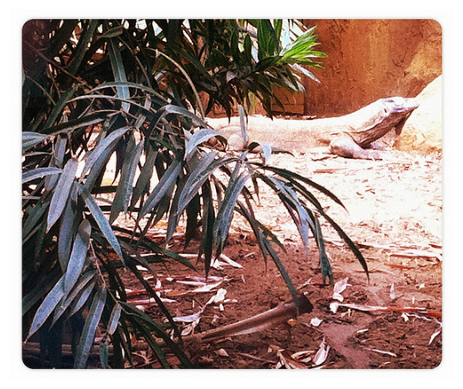

The prediction set is: [np.str_('green iguana'), np.str_('Gila monster'), np.str_('Komodo dragon'), np.str_('triceratops'), np.str_('echidna'), np.str_('wombat')]


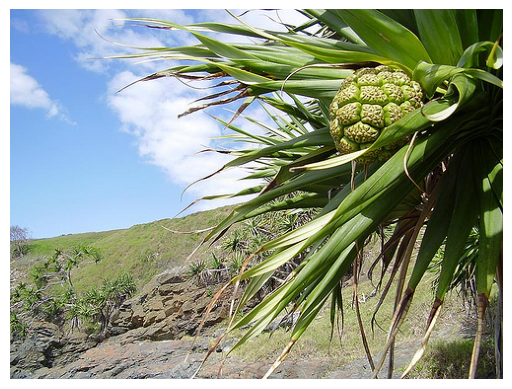

The prediction set is: [np.str_('pineapple')]


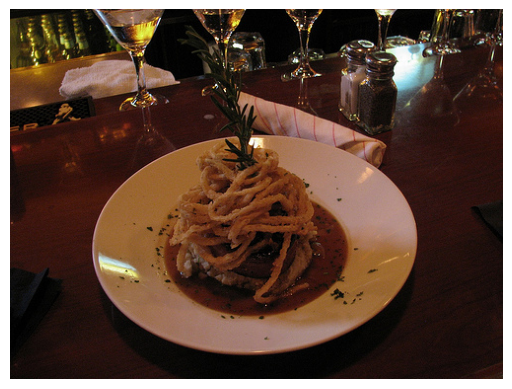

The prediction set is: [np.str_('plate'), np.str_('mashed potato'), np.str_('carbonara')]


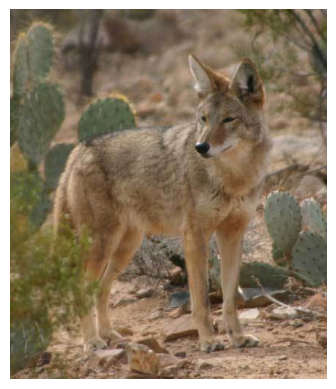

The prediction set is: [np.str_('red wolf'), np.str_('coyote')]


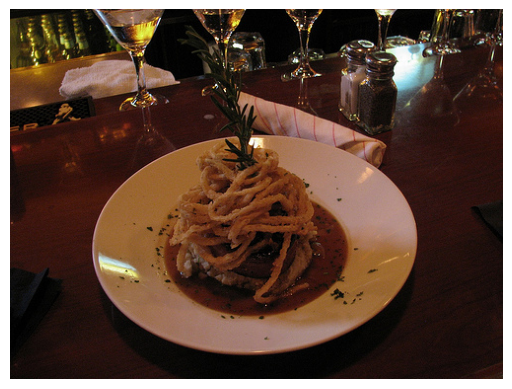

The prediction set is: [np.str_('plate'), np.str_('mashed potato'), np.str_('carbonara')]


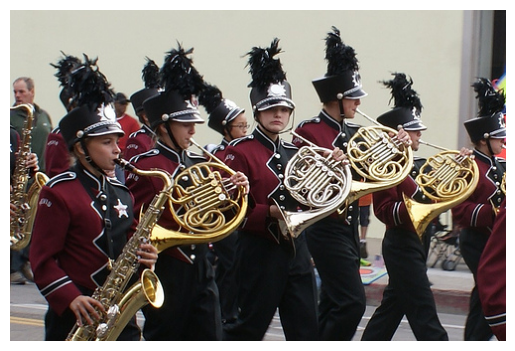

The prediction set is: [np.str_('French horn')]


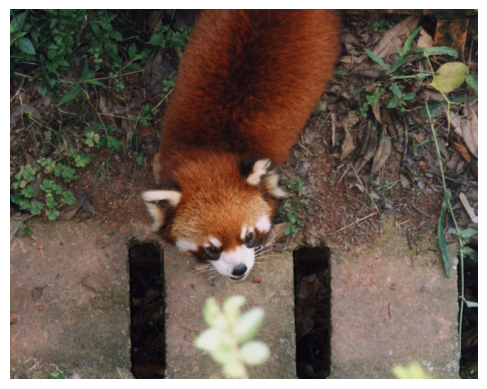

The prediction set is: [np.str_('red panda')]


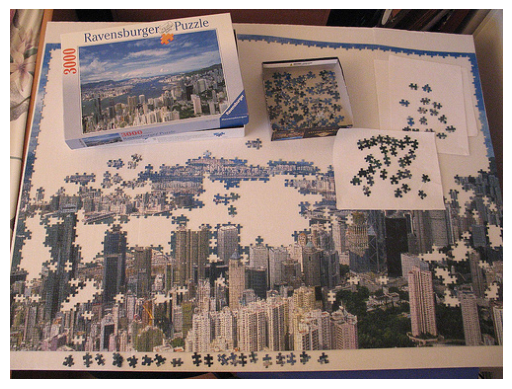

The prediction set is: [np.str_('jigsaw puzzle')]


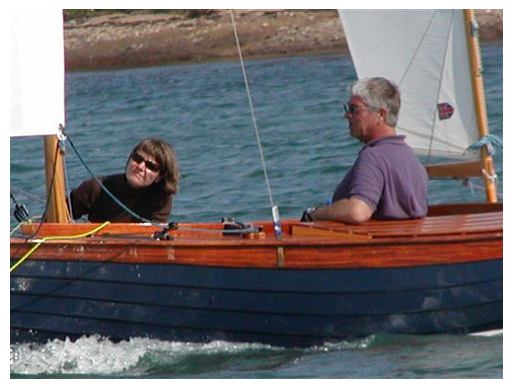

The prediction set is: [np.str_('yawl')]


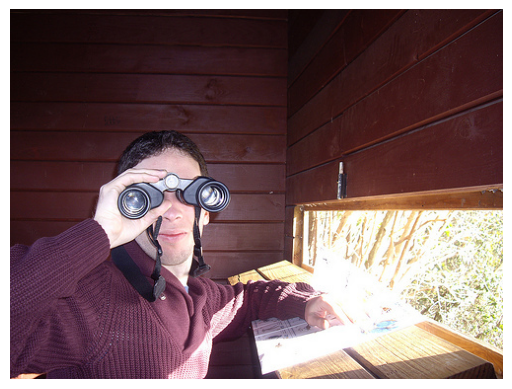

The prediction set is: [np.str_('binoculars')]


In [ ]:
# Show some examples
with open('../data/imagenet/human_readable_labels.json') as f:
    label_strings = np.array(json.load(f))

example_paths =os.listdir('../data/imagenet/examples')
for i in range(10):
    rand_path = np.random.choice(example_paths)
    img = imread('../data/imagenet/examples/' + rand_path )
    img_index = int(rand_path.split('.')[0])
    # Form the prediction set
    _smx = smx[img_index]
    _pi = np.argsort(_smx)[::-1]
    _srt = np.take_along_axis(_smx,_pi,axis=0)
    _srt_reg = _srt + reg_vec.squeeze()
    _srt_reg_cumsum = _srt_reg.cumsum()
    _ind = (_srt_reg_cumsum - np.random.rand()*_srt_reg) <= qhat if rand else _srt_reg_cumsum - _srt_reg <= qhat
    if disallow_zero_sets: _ind[0] = True
    prediction_set = np.take_along_axis(_ind,_pi.argsort(),axis=0)
    plt.figure()
    plt.imshow(img)
    plt.axis('off')
    plt.show()
    print(f"The prediction set is: {list(label_strings[prediction_set])}")